Εργασία 1 Τεχνικές Εξόρυξης Δεδομένων

1115201900274


Αρχικά διαβάζουμε τα csv για τις χρονίες 2019 και 2023 απο τα κατάλληλα path και δημιουργούμε τα αντίστιχα dataframes με ζητούμενα columns και τα νεα cvs.

In [1]:
import numpy as np
import pandas as pd
from google.colab import drive
import os


drive.mount('/content/drive')

folders_2019 = ['febrouary', 'march', 'april']
folders_2023 = ['march', 'june', 'september']

columns = [
    'id', 'zipcode', 'transit', 'bedrooms', 'beds', 'review_scores_rating',
    'number_of_reviews', 'neighbourhood', 'name', 'latitude', 'longitude',
    'last_review', 'instant_bookable', 'host_since', 'host_response_rate',
    'host_identity_verified', 'host_has_profile_pic', 'first_review',
    'description', 'city', 'cancellation_policy', 'bed_type', 'bathrooms',
    'accommodates', 'amenities', 'room_type', 'property_type', 'price',
    'availability_365', 'minimum_nights', 'month','neighbourhood_cleansed','host_id']

base_folder_path = '/content/drive/My Drive/data'

dfs_2019 = []
dfs_2023 = []

for folder in folders_2019:
    folder_path = os.path.join('/content/drive/My Drive/data/2019', folder)
    files = os.listdir(folder_path)

    file_path = os.path.join(folder_path, 'listings.csv')
    df = pd.read_csv(file_path)
    filtered_columns = [col for col in columns if col in df.columns]
    df_filtered = df[filtered_columns]
    df_filtered['month'] = folder

    dfs_2019.append(df_filtered)


df_2019 = pd.concat(dfs_2019, ignore_index=True)

df_2019.to_csv('/content/drive/My Drive/data/train_2019.csv', index=False)


for folder in folders_2023:
    folder_path = os.path.join('/content/drive/My Drive/data/2023', folder)
    files = os.listdir(folder_path)

    file_path = os.path.join(folder_path, 'listings.csv')
    df = pd.read_csv(file_path)
    filtered_columns = [col for col in columns if col in df.columns]
    df_filtered = df[filtered_columns]
    df_filtered['month'] = folder

    dfs_2023.append(df_filtered)

df_2023 = pd.concat(dfs_2023, ignore_index=True)

df_2023.to_csv('/content/drive/My Drive/data/train_2023.csv', index=False)





Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


<ipython-input-1-ec0ab0989184>:31: DtypeWarning: Columns (61,62) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)
<ipython-input-1-ec0ab0989184>:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered['month'] = folder
<ipython-input-1-ec0ab0989184>:31: DtypeWarning: Columns (61,62) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)
<ipython-input-1-ec0ab0989184>:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-vie

Στην συνέχεια απαλείφουμε τα missing values και τις ακραίες τιμές για το column bedroom και price, που κρίθηκε σκόπημο, με τη μέθοδο z-scores.


In [2]:
df_2019 = pd.read_csv('/content/drive/My Drive/data/train_2019.csv')
df_2023 = pd.read_csv('/content/drive/My Drive/data/train_2023.csv')

# deleting the rows that have a missing value
df_2019 = df_2019.dropna()

df_2023= df_2023.drop(columns='bathrooms') #every row is Nan in 2023 so it makes drop all the rows
df_2023 = df_2023.dropna()


from scipy import stats

df_2019['price'] = df_2019['price'].replace('[\$,]', '', regex=True).astype(float) #delete the $ sign to make the prices floats
df_2023['price'] = df_2023['price'].replace('[\$,]', '', regex=True).astype(float)

z_score = np.abs(stats.zscore(df_2019['bedrooms']))

# find the outliers with a z-score greater than 3
threshold = 3
outliers = df_2019.index[z_score > threshold]

df_2019=df_2019.drop(outliers)


z_score = np.abs(stats.zscore(df_2023['bedrooms']))

threshold = 3
outliers = df_2023.index[z_score > threshold]

df_2023=df_2023.drop(outliers)


z_score = np.abs(stats.zscore(df_2019['price']))

# find the outliers with a z-score greater than 3
threshold = 3
outliers = df_2019.index[z_score > threshold]

df_2019=df_2019.drop(outliers)


z_score = np.abs(stats.zscore(df_2023['price']))

threshold = 3
outliers = df_2023.index[z_score > threshold]

df_2023=df_2023.drop(outliers)




In [3]:
#question 1.1

most_common_room_type_2019 = df_2019['room_type'].mode()[0]
most_common_room_type_2023 = df_2023['room_type'].mode()[0]

print("Ο πιο συχνός τύπος room_type για το 2019 είναι:", most_common_room_type_2019)
print("Ο πιο συχνός τύπος room_type για το 2023 είναι:", most_common_room_type_2023)



Ο πιο συχνός τύπος room_type για το 2019 είναι: Entire home/apt
Ο πιο συχνός τύπος room_type για το 2023 είναι: Entire home/apt


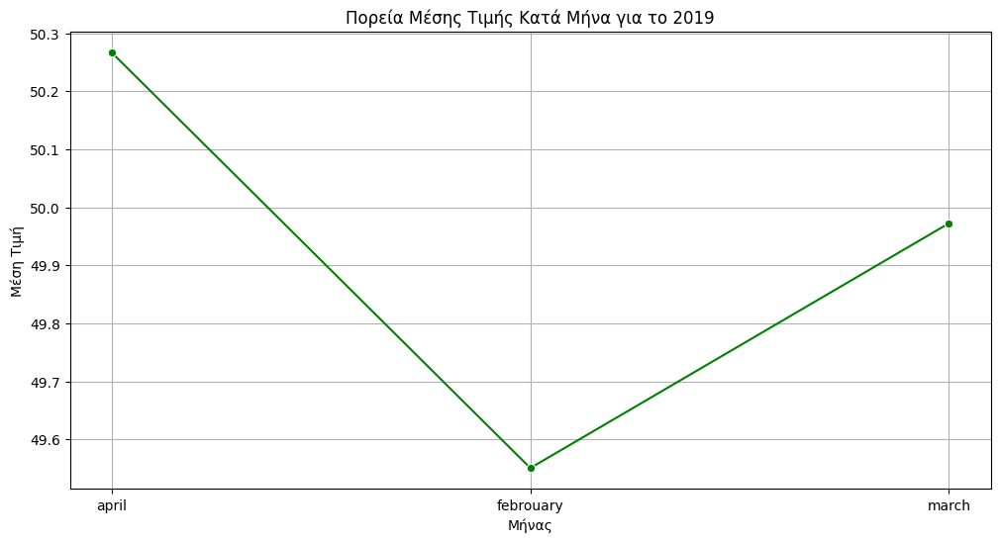

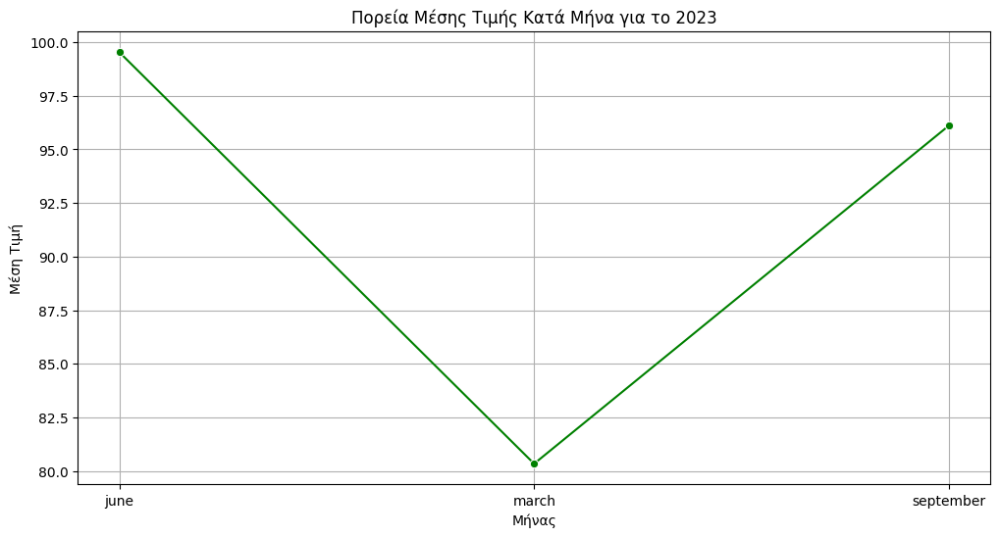

In [4]:
#question 1.2


import matplotlib.pyplot as plt
import seaborn as sns



average_prices = df_2019.groupby(df_2019.month)['price'].mean() #average price per month

plt.figure(figsize=(12, 6))
sns.lineplot(x=average_prices.index, y=average_prices.values, marker='o', color='green')
plt.title('Πορεία Μέσης Τιμής Κατά Μήνα για το 2019')
plt.xlabel('Μήνας')
plt.ylabel('Μέση Τιμή')
plt.grid(True)
plt.show()


average_prices = df_2023.groupby(df_2023.month)['price'].mean()

plt.figure(figsize=(12, 6))
sns.lineplot(x=average_prices.index, y=average_prices.values, marker='o', color='green')
plt.title('Πορεία Μέσης Τιμής Κατά Μήνα για το 2023')
plt.xlabel('Μήνας')
plt.ylabel('Μέση Τιμή')
plt.grid(True)
plt.show()




In [6]:
#question 1.3

reviews_per_neighborhood_2019 = df_2019.groupby('neighbourhood')['number_of_reviews'].sum()
reviews_per_neighborhood_2023 = df_2023.groupby('neighbourhood_cleansed')['number_of_reviews'].sum()

top5_2019 = reviews_per_neighborhood_2019.nlargest(5)
top5_2023 = reviews_per_neighborhood_2023.nlargest(5)

print("Top 5 neighborhoods with the most reviews for 2019 are:")
print(top5_2019.to_string(index=True))
print("\n Top 5 neighborhoods with the most reviews for 2023 are:")
print(top5_2023.to_string(index=True))



Top 5 neighborhoods with the most reviews for 2019 are:
neighbourhood
Plaka          104532
Koukaki         73322
Neos Kosmos     63460
Psyri           41697
Pangrati        32089

 Top 5 neighborhoods with the most reviews for 2023 are:
neighbourhood_cleansed
ΕΜΠΟΡΙΚΟ ΤΡΙΓΩΝΟ-ΠΛΑΚΑ              285330
ΚΟΥΚΑΚΙ-ΜΑΚΡΥΓΙΑΝΝΗ                 152092
ΝΕΟΣ ΚΟΣΜΟΣ                          79000
ΑΓΙΟΣ ΚΩΝΣΤΑΝΤΙΝΟΣ-ΠΛΑΤΕΙΑ ΒΑΘΗΣ     68832
ΜΟΥΣΕΙΟ-ΕΞΑΡΧΕΙΑ-ΝΕΑΠΟΛΗ             66100


In [7]:
#question 1.4

registartions_per_neighborhood_2019 = df_2019['neighbourhood'].value_counts()
registrations_per_neighborhood_2023 = df_2023['neighbourhood_cleansed'].value_counts()

most_2019 = registartions_per_neighborhood_2019.idxmax()
most_2023 = registrations_per_neighborhood_2023.idxmax()

print("The neighborhood with the most property registartions for 2019 is:", most_2019)
print("The neighborhood with the most property registartions for 2023 is:", most_2023)


The neighborhood with the most property registartions for 2019 is: Plaka
The neighborhood with the most property registartions for 2023 is: ΕΜΠΟΡΙΚΟ ΤΡΙΓΩΝΟ-ΠΛΑΚΑ


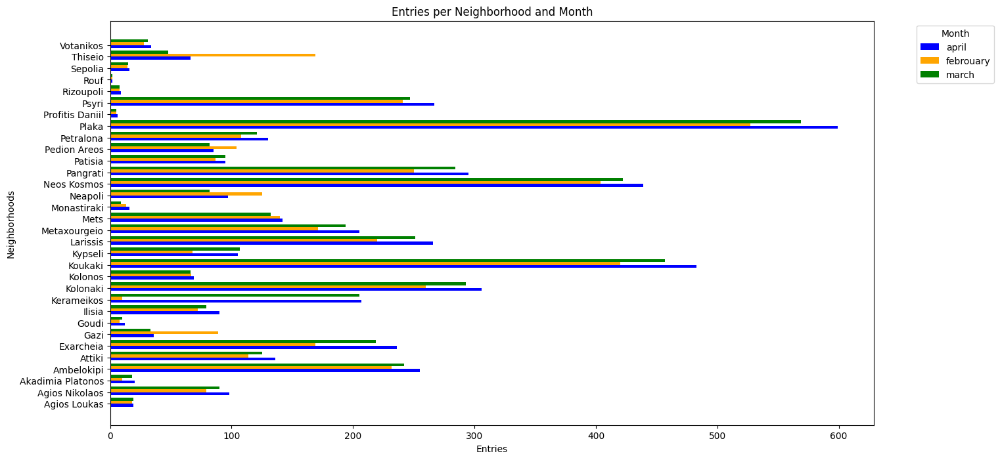

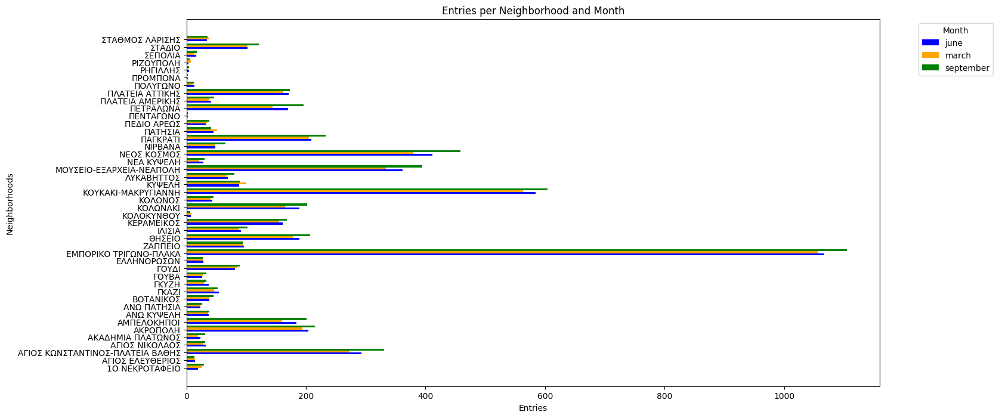

In [8]:
#question 1.5 , 1,6

registers_per_neighborhood_per_month_2019 = df_2019.groupby(['neighbourhood', 'month']).size().unstack(fill_value=0)
#print(registers_per_neighborhood_per_month_2019)


plt.figure(figsize=(15, 8))
colors = ['blue', 'orange', 'green']
width = 0.25

for i, month in enumerate(registers_per_neighborhood_per_month_2019.columns):
    plt.barh(np.arange(len(registers_per_neighborhood_per_month_2019)) - width/2 + i*width,
             registers_per_neighborhood_per_month_2019[month],
             height=width, color=colors[i], label=month)

plt.yticks(np.arange(len(registers_per_neighborhood_per_month_2019)), registers_per_neighborhood_per_month_2019.index)

plt.xlabel('Entries')
plt.ylabel('Neighborhoods')
plt.title('Entries per Neighborhood and Month')
plt.legend(title='Month', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.show()

#2023

registers_per_neighborhood_per_month_2023 = df_2023.groupby(['neighbourhood_cleansed', 'month']).size().unstack(fill_value=0)
#print(registers_per_neighborhood_per_month_2023)

plt.figure(figsize=(15, 8))
colors = ['blue', 'orange', 'green']
width = 0.25

for i, month in enumerate(registers_per_neighborhood_per_month_2023.columns):
    plt.barh(np.arange(len(registers_per_neighborhood_per_month_2023)) - width/2 + i*width,
             registers_per_neighborhood_per_month_2023[month],
             height=width, color=colors[i], label=month)

plt.yticks(np.arange(len(registers_per_neighborhood_per_month_2023)), registers_per_neighborhood_per_month_2023.index)

plt.xlabel('Entries')
plt.ylabel('Neighborhoods')
plt.title('Entries per Neighborhood and Month')
plt.legend(title='Month', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.show()

In [9]:
#question 1.7

most_common_room_type_2019 = df_2019.groupby(['neighbourhood'])['room_type'].apply(lambda x: x.value_counts().index[0])
most_common_room_type_2023 = df_2023.groupby(['neighbourhood_cleansed'])['room_type'].apply(lambda x: x.value_counts().index[0])

print("Most common room types in 2019:")
print(most_common_room_type_2019)
print("\nMost common room types in 2023:")
print(most_common_room_type_2023)

Most common room types in 2019:
neighbourhood
Agios Loukas         Entire home/apt
Agios Nikolaos       Entire home/apt
Akadimia Platonos    Entire home/apt
Ambelokipi           Entire home/apt
Attiki               Entire home/apt
Exarcheia            Entire home/apt
Gazi                 Entire home/apt
Goudi                Entire home/apt
Ilisia               Entire home/apt
Kerameikos           Entire home/apt
Kolonaki             Entire home/apt
Kolonos              Entire home/apt
Koukaki              Entire home/apt
Kypseli              Entire home/apt
Larissis             Entire home/apt
Metaxourgeio         Entire home/apt
Mets                 Entire home/apt
Monastiraki          Entire home/apt
Neapoli              Entire home/apt
Neos Kosmos          Entire home/apt
Pangrati             Entire home/apt
Patisia              Entire home/apt
Pedion Areos         Entire home/apt
Petralona            Entire home/apt
Plaka                Entire home/apt
Profitis Daniil      Entire h

O πιο ακριβός τύπος δωματίου θεωρείται ο room type με το πιό ακριβό δωμάτιο καί οχί σε σχέση με τον μέσω όρο τιμής ανα τύπο δωματίου

In [10]:
# question 1.8

most_expensive_type_2019 = df_2019.loc[df_2019['price'].idxmax(), 'room_type']
highest_price_2019 = df_2019['price'].max()

most_expensive_type_2023 = df_2023.loc[df_2023['price'].idxmax(), 'room_type']
highest_price_2023 = df_2023['price'].max()

print(f"The most expensive room type in 2019 is '{most_expensive_type_2019}' with a price of ${highest_price_2019:.2f} per night.")
print(f"The most expensive room type in 2023 is '{most_expensive_type_2023}' with a price of ${highest_price_2023:.2f} per night.")


The most expensive room type in 2019 is 'Entire home/apt' with a price of $179.00 per night.
The most expensive room type in 2023 is 'Entire home/apt' with a price of $629.00 per night.


In [11]:
# question 1.9

import folium

selected_month_df = df_2019[df_2019['month'] == 'april']
m = folium.Map(location=[selected_month_df['latitude'].mean(), selected_month_df['longitude'].mean()], zoom_start=12)

for index, row in selected_month_df.iterrows():
    popup_info = f"Room Type: {row['room_type']}<br>Bed Type: {row['bed_type']}<br>Transit: {row['transit']}"
    folium.Marker([row['latitude'], row['longitude']], popup=popup_info).add_to(m)

display(m)




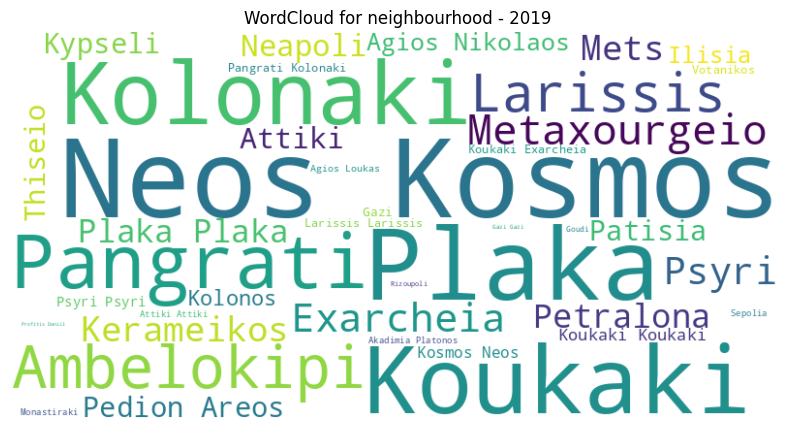

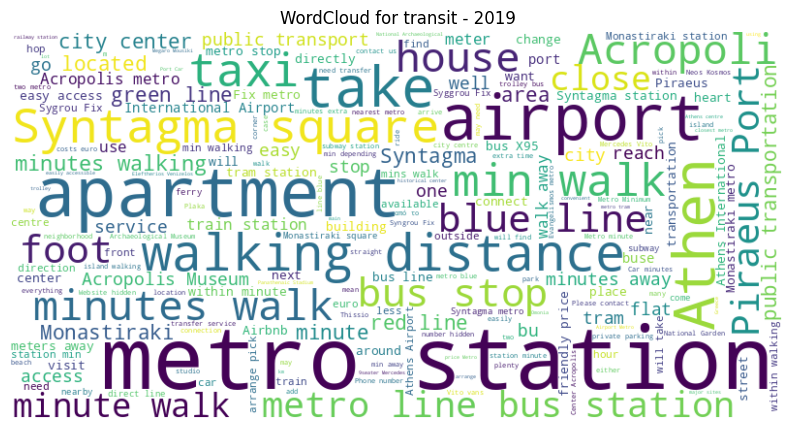

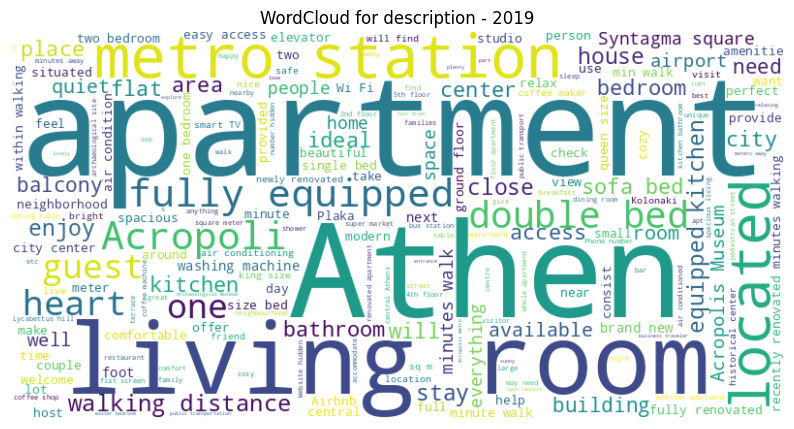

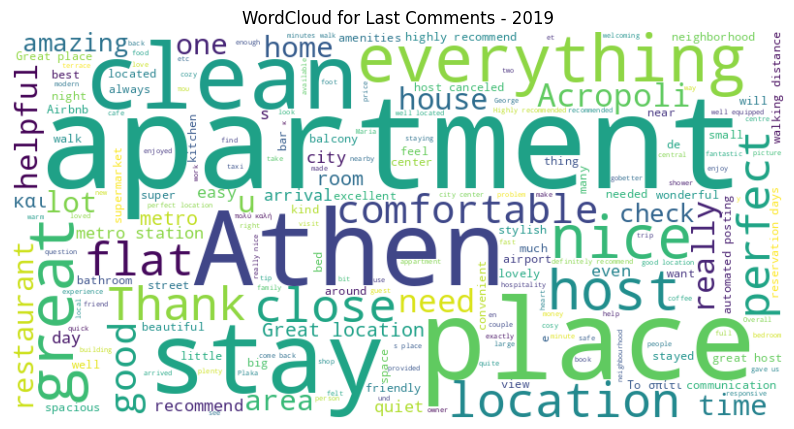

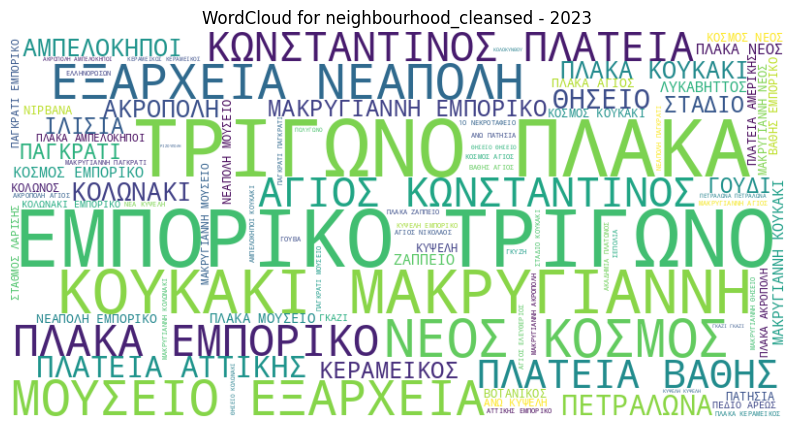

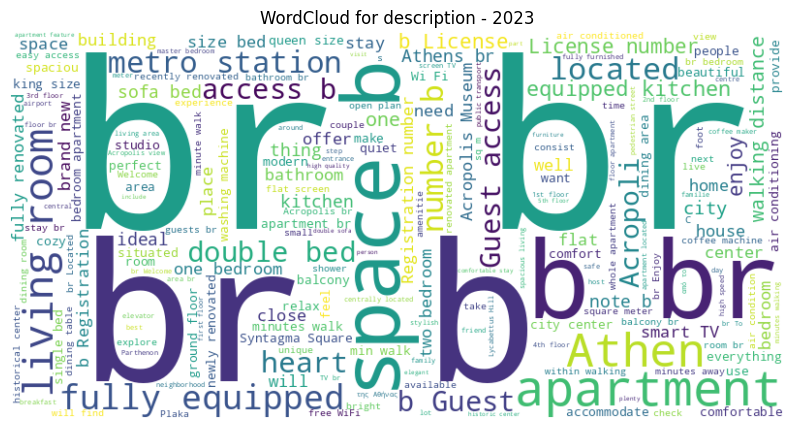

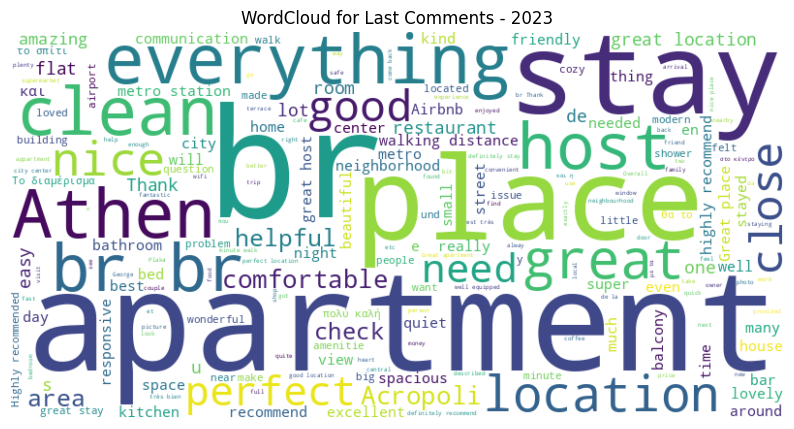

In [12]:
#question 1.10

from wordcloud import WordCloud

#2019

columns = ['neighbourhood', 'transit', 'description']

for column in columns:
    text = ' '.join(df_2019[column].dropna())

    wordcloud = WordCloud(width=800, height=400, background_color ='white').generate(text)

    plt.figure(figsize=(10, 6))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'WordCloud for {column} - 2019')
    plt.axis('off')
    plt.show()

#retrive comments and display their wordcloud
file_paths = [
    '/content/drive/My Drive/data/2019/april/reviews.csv',
    '/content/drive/My Drive/data/2019/febrouary/reviews.csv',
    '/content/drive/My Drive/data/2019/march/reviews.csv'
]

all_comments_df = pd.DataFrame()

for file_path in file_paths:

    df = pd.read_csv(file_path)
    all_comments_df = pd.concat([all_comments_df, df])


last_comments = all_comments_df.groupby('listing_id')['comments'].last().dropna()

text = ' '.join(last_comments)
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)

plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('WordCloud for Last Comments - 2019')
plt.axis('off')
plt.show()

#2023

columns = ['neighbourhood_cleansed', 'description']

for column in columns:
    text = ' '.join(df_2023[column].dropna())

    wordcloud = WordCloud(width=800, height=400, background_color ='white').generate(text)

    plt.figure(figsize=(10, 6))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'WordCloud for {column} - 2023')
    plt.axis('off')
    plt.show()

#retrive comments and display their wordcloud
file_paths = [
    '/content/drive/My Drive/data/2023/june/reviews.csv',
    '/content/drive/My Drive/data/2023/september/reviews.csv',
    '/content/drive/My Drive/data/2023/march/reviews.csv'
]

all_comments_df = pd.DataFrame()

for file_path in file_paths:

    df = pd.read_csv(file_path)
    all_comments_df = pd.concat([all_comments_df, df])


last_comments = all_comments_df.groupby('listing_id')['comments'].last().dropna()

text = ' '.join(last_comments)
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)

plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('WordCloud for Last Comments - 2023')
plt.axis('off')
plt.show()




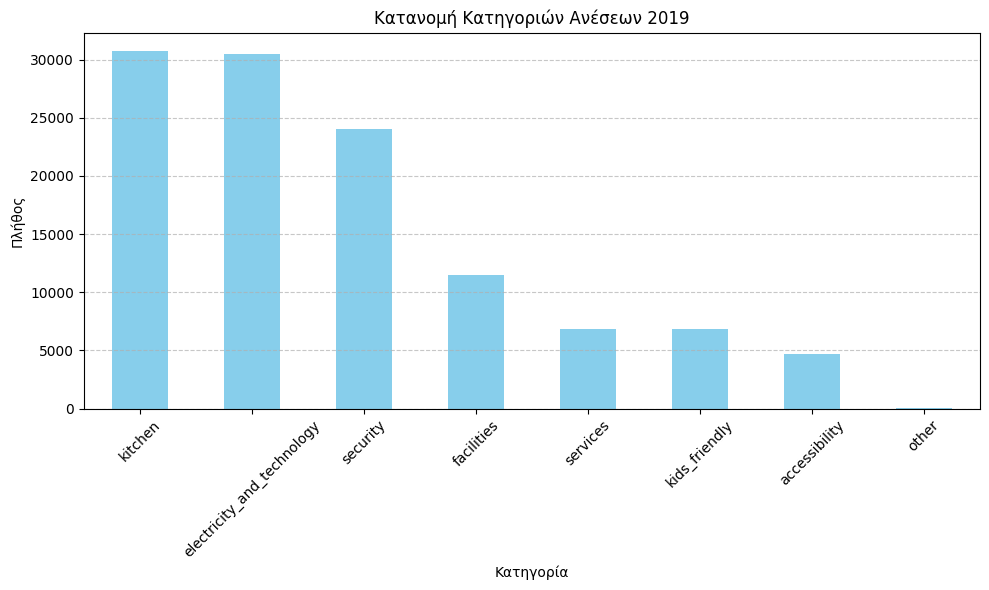

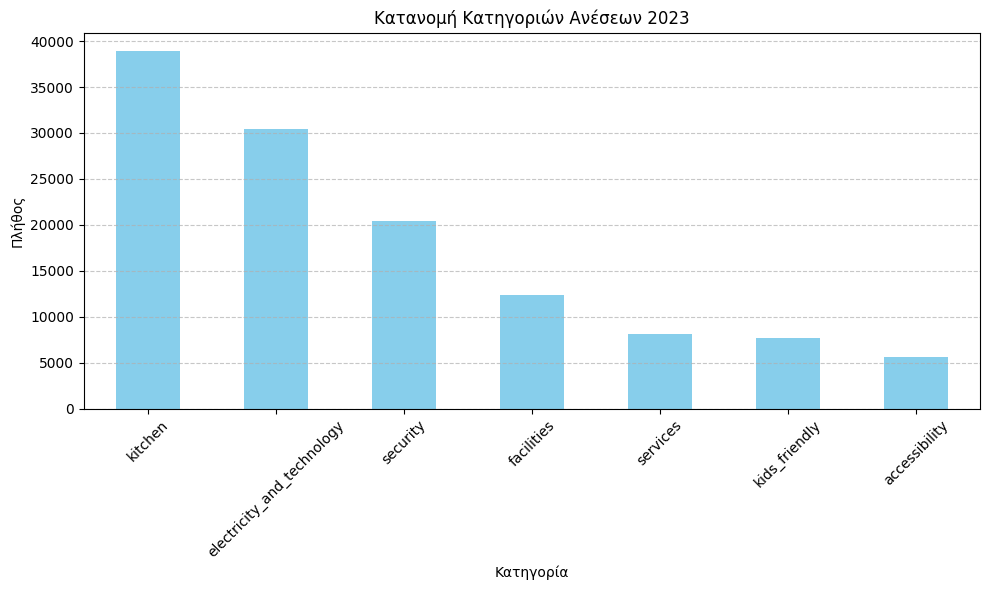

In [13]:
#question 1.11


categories = {
    'kitchen': ['Breakfast', 'Cooking basics', 'BBQ', 'grill', 'oven', 'Coffee maker','Washer','Dryer'],
    'accessibility': ['Wheelchair accessible', 'Paid parking', ' Elevator'],
    'electricity_and_technology': ['Wifi', 'Internet', 'Cable TV', 'TV'],
    'facilities': ['Pool', 'Gym', 'Free street parking','Paid parking off premises'],
    'kids_friendly': ['Children’s dinnerware', 'Crib', 'High chair', 'Pack ’n Play/travel crib'],
    'security': ['Smoke detector', 'Carbon monoxide detector', 'Fire extinguisher', 'First aid kit'],
    'services': ['Pets allowed', 'Luggage dropoff allowed', 'First aids']
}

def categorize_amenities(amenities):
    categorized = []
    for category, values in categories.items():
        for value in values:
            if value in amenities:
                categorized.append(category)
    if not categorized:
        categorized.append('other')
    return categorized


df_2019['amenities'] = df_2019['amenities'].apply(categorize_amenities)

category_counts = df_2019['amenities'].explode().value_counts()

plt.figure(figsize=(10, 6))
category_counts.plot(kind='bar', color='skyblue')
plt.title('Κατανομή Κατηγοριών Ανέσεων 2019')
plt.xlabel('Κατηγορία')
plt.ylabel('Πλήθος')
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


df_2023['amenities'] = df_2023['amenities'].apply(categorize_amenities)

category_counts = df_2023['amenities'].explode().value_counts()

plt.figure(figsize=(10, 6))
category_counts.plot(kind='bar', color='skyblue')
plt.title('Κατανομή Κατηγοριών Ανέσεων 2023')
plt.xlabel('Κατηγορία')
plt.ylabel('Πλήθος')
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

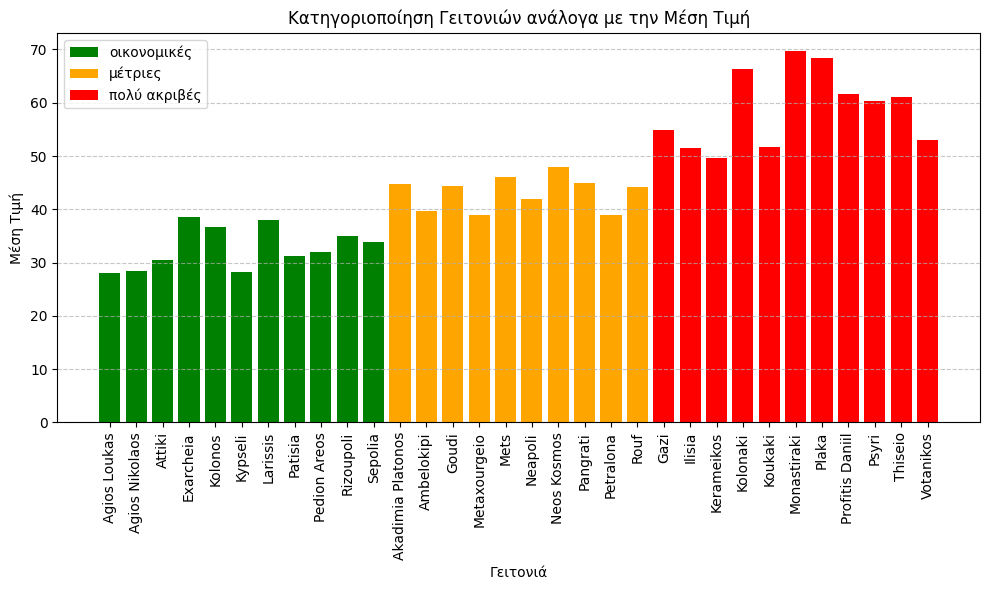

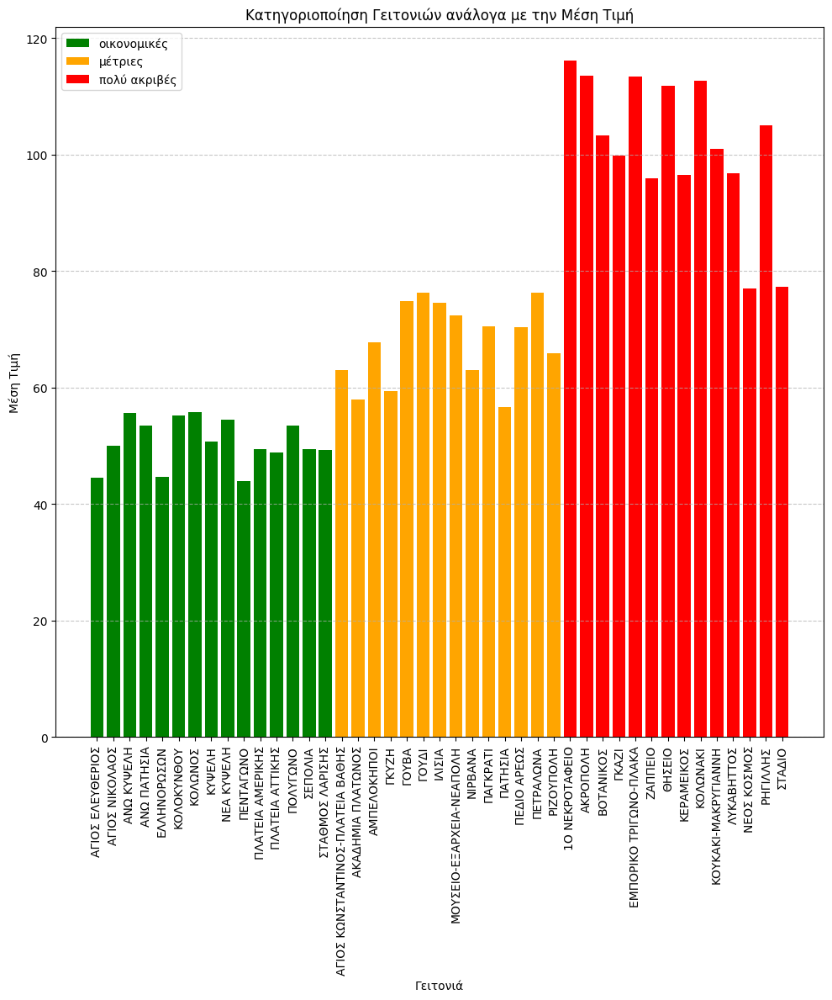

In [14]:
#question 1.12

df_filtered = df_2019[df_2019['beds'] == 2]

neighborhood_avg_price = df_filtered.groupby('neighbourhood')['price'].mean().reset_index()

quantiles = [0, 1/3, 2/3, 1]

neighborhood_avg_price['category'] = pd.qcut(neighborhood_avg_price['price'], q=quantiles, labels=['οικονομικές', 'μέτριες', 'πολύ ακριβές'])

plt.figure(figsize=(10, 6))
colors = {'οικονομικές': 'green', 'μέτριες': 'orange', 'πολύ ακριβές': 'red'}
for category, color in colors.items():
    subset = neighborhood_avg_price[neighborhood_avg_price['category'] == category]
    plt.bar(subset['neighbourhood'], subset['price'], color=color, label=category)

plt.title('Κατηγοριοποίηση Γειτονιών ανάλογα με την Μέση Τιμή')
plt.xlabel('Γειτονιά')
plt.ylabel('Μέση Τιμή')
plt.xticks(rotation=90)
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

#2023

df_filtered = df_2023[df_2023['beds'] == 2]

neighborhood_avg_price = df_filtered.groupby('neighbourhood_cleansed')['price'].mean().reset_index()

quantiles = [0, 1/3, 2/3, 1]

neighborhood_avg_price['category'] = pd.qcut(neighborhood_avg_price['price'], q=quantiles, labels=['οικονομικές', 'μέτριες', 'πολύ ακριβές'])

plt.figure(figsize=(10, 12))
colors = {'οικονομικές': 'green', 'μέτριες': 'orange', 'πολύ ακριβές': 'red'}
for category, color in colors.items():
    subset = neighborhood_avg_price[neighborhood_avg_price['category'] == category]
    plt.bar(subset['neighbourhood_cleansed'], subset['price'], color=color, label=category)

plt.title('Κατηγοριοποίηση Γειτονιών ανάλογα με την Μέση Τιμή')
plt.xlabel('Γειτονιά')
plt.ylabel('Μέση Τιμή')
plt.xticks(rotation=90)
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

Ερώτηση 1.13:
a) Πόσες κριτικές έχουν γίνει ανα δωμάτιο σε κάθε περιοχή για το 2019;

b)Ποιο είναι το μέσο κόστος διαμονής ανά δωμάτιο τύπου για κάθε γειτονιά;

c)Ποια είναι η μέση τιμή διανυκτέρευσης ανα άτομο σε κάθε γειτονιά ;

In [15]:
#question 1.13
#a)

print("\n Ερωτηση a:")
reviews_per_room_type_per_neighbourhood_2019 = df_2019.groupby(['neighbourhood', 'room_type'])['number_of_reviews'].sum().reset_index()

print(reviews_per_room_type_per_neighbourhood_2019)

#b)

print("\n Ερωτηση b:")
average_price_per_room_type_per_neighbourhood_2019 = df_2019.groupby(['neighbourhood', 'room_type'])['price'].mean().reset_index()

print(average_price_per_room_type_per_neighbourhood_2019)

#c)

print("\n Ερωτηση c:")

average_price_per_neighbourhood_beds_2019 = df_2019.groupby(['neighbourhood', 'beds'])['price'].mean().reset_index()

print(average_price_per_neighbourhood_beds_2019)





 Ερωτηση a:
        neighbourhood        room_type  number_of_reviews
0        Agios Loukas  Entire home/apt               1562
1        Agios Loukas     Private room                132
2      Agios Nikolaos  Entire home/apt               8582
3      Agios Nikolaos     Private room                582
4   Akadimia Platonos  Entire home/apt               2573
..                ...              ...                ...
63            Sepolia  Entire home/apt                917
64            Thiseio  Entire home/apt              11192
65            Thiseio     Private room               1283
66          Votanikos  Entire home/apt               3244
67          Votanikos     Private room                878

[68 rows x 3 columns]

 Ερωτηση b:
        neighbourhood        room_type      price
0        Agios Loukas  Entire home/apt  36.803922
1        Agios Loukas     Private room  19.200000
2      Agios Nikolaos  Entire home/apt  31.224900
3      Agios Nikolaos     Private room  18.111111
4   A

In [16]:
#question 1.14

host_listings_2019 = df_2019.groupby('host_id').size().reset_index(name='num_host_listings')

top_10_2019 = host_listings_2019.sort_values(by='num_host_listings', ascending=False).head(10)
print("10 hosts με τα περισσότερα ακίνητα για το 2019")
print(top_10_2019)

host_listings_2023 = df_2023.groupby('host_id').size().reset_index(name='num_host_listings')

top_10_2023 = host_listings_2023.sort_values(by='num_host_listings', ascending=False).head(10)
print("\n10 hosts με τα περισσότερα ακίνητα για το 2023")
print(top_10_2023)

10 hosts με τα περισσότερα ακίνητα για το 2019
        host_id  num_host_listings
796    29927830                236
86      1621474                159
73      1418201                123
1833  112527018                111
99      2089542                108
1349   65714690                 98
594    20104194                 83
61      1167063                 72
1220   55670751                 72
124     2718115                 67

10 hosts με τα περισσότερα ακίνητα για το 2023
        host_id  num_host_listings
427    20104194                281
1177   90390850                197
1325  113548208                179
1317  112527018                134
1377  123074489                127
71      1418201                122
1329  114156592                110
1194   92310506                 98
599    31290848                 90
574    29927830                 85


 ***Question 15***


Οι μέσες τιμές για τις βραχυχρόνιες μισθώσεις φαίνεται να έχουν αυξηθεί σημαντικά από το 2019 στο 2023, με τον μέση τιμή Μαρτίου να έχει αυξηθεί κατα 30 με 35 ευρώ.

Και τις δύο χρονίες βλέπουμε τα περισσότερα review αλλα και καταχωρίσεις αρα σε κεντρικές γειτονιές, κάτι που σημαίνει πως αποτέλουν τις δημοφιλέστερες.

Οι ακριβές γειτονιές του 2019, όπως η Πλάκα και η ευρύτερη περιοχή του κένρου, παραμένουν οι πιο ακριβές και για το 2023 υποδηλώνοντας την αυξημένη ζήτηση σε αυτες.

Εδώ ξεκινά η επεξεργασία για το 2ο μέρος της εργασίας, οπου θα χρησιμοποιούνται id, name, description για το 2019 περασμένα στο new_df

Αυτό το κελί θα περιέχει τα import και τα from


In [17]:
import nltk
from sklearn.feature_extraction.text import ENGLISH_STOP_WORDS as stopwords
from wordcloud import WordCloud
from nltk.corpus import stopwords as nltk_stopwords
from nltk.tokenize import word_tokenize
nltk.download('punkt')
nltk.download('stopwords')
import string
import re
from nltk.corpus import stopwords


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


Αυτό το κελί θα περιέχει κάποιες βασικές συναρτήσεις για την επεξεργασία

In [18]:
#removing emojis
emoji_pattern = re.compile("["
                           u"\U0001F600-\U0001F64F"
                           u"\U0001F300-\U0001F5FF"
                           u"\U0001F680-\U0001F6FF"
                           u"\U0001F1E0-\U0001F1FF"
                           u"\U00002500-\U00002BEF"
                           u"\U00002702-\U000027B0"
                           u"\U00002702-\U000027B0"
                           u"\U000024C2-\U0001F251"
                           u"\U0001f926-\U0001f937"
                           u"\U00010000-\U0010ffff"
                           u"\u2640-\u2642"
                           u"\u2600-\u2B55"
                           u"\u200d"
                           u"\u23cf"
                           u"\u23e9"
                           u"\u231a"
                           u"\ufe0f"
                           u"\u3030"
                           "]+", flags=re.UNICODE)

def remove_emojis(text):
    return emoji_pattern.sub(r'', text)

def remove_punctuation(text):
    result = ''
    for char in text:
        if char in string.punctuation:
            result += ' '
        else:
            result += char
    return result

def preprocess_text(text):
    text = text.lower()

    tokens = re.findall(r'\b\w+\b', text)

    stop_words = set(stopwords.words('english'))
    filtered_tokens = [word for word in tokens if word not in stop_words]

    processed_text = ' '.join(filtered_tokens)

    return text


Υλοποίηση

In [19]:
new_df = df_2019[['name', 'id', 'description']].copy()

new_df['name'] = new_df['name'].apply(remove_emojis)
new_df['name'] = new_df['name'].apply(remove_punctuation)
new_df['name'] = new_df['name'].apply(preprocess_text)
new_df['name'].fillna('null', inplace=True)

#new_df['description'] = new_df['description'].apply(lambda x: ' '.join(map(str, x)))

new_df['description'] = new_df['description'].apply(remove_punctuation)
new_df['description'] = new_df['description'].apply(remove_emojis)
new_df['description'] = new_df['description'].apply(preprocess_text)
new_df['description'].fillna('null', inplace=True)

#Concat

new_df['name_description'] = new_df['name'] + ' ' + new_df['description']

Wordcloud


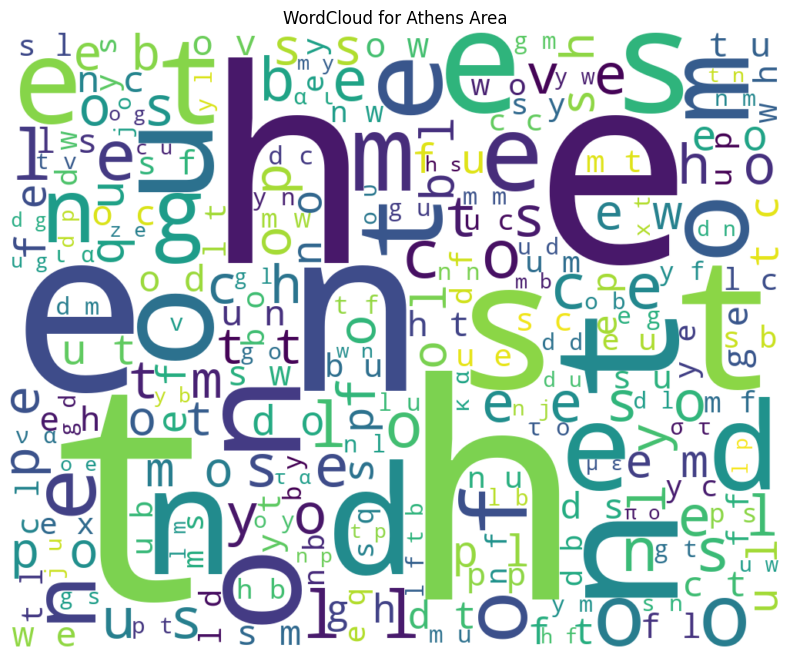

Top 10 most characteristic words for athens are:
e: 1093261
a: 906715
t: 901047
o: 794715
i: 709625
n: 670477
s: 611590
r: 609314
l: 432663
h: 416581


In [20]:
from collections import Counter

text = ' '.join(' '.join(tokens) for tokens in new_df['description'].dropna())
wordcloud = WordCloud(width=1000, height=800, background_color='white').generate(text)

plt.figure(figsize=(12, 8))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('WordCloud for Athens Area')
plt.axis('off')
plt.show()

word_frequency = Counter(word_tokenize(text))

top_10_words = word_frequency.most_common(10)

print("Top 10 most characteristic words for athens are:")
for word, freq in top_10_words:
    print(f"{word}: {freq}")

#new_df['name_description'] = new_df.apply(lambda row: f"{row['name']} {row['description']}", axis=1)


In [21]:
#question 1

from sklearn.feature_extraction.text import TfidfVectorizer

tfidf_vectorizer = TfidfVectorizer(stop_words='english', ngram_range=(1, 2))
tfidf_vectorizer.fit(new_df['name_description'])
tfidf_matrix = tfidf_vectorizer.transform(new_df['name_description'])
arr_tfidf_matrix = tfidf_matrix.toarray()

print(arr_tfidf_matrix)


[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


In [ ]:
#question 2

from sklearn.metrics.pairwise import cosine_similarity

cosine_sim_matrix = cosine_similarity(arr_tfidf_matrix)

def get_top_n_similar_houses(cosine_sim_matrix, N=100):
    similar_houses_dict = {}
    for idx in range(cosine_sim_matrix.shape[0]):

        similar_indices = np.argsort(cosine_sim_matrix[idx])[::-1][1:N+1]
        similar_scores = cosine_sim_matrix[idx][similar_indices]
        similar_houses_dict[idx] = list(zip(similar_indices, similar_scores))
    return similar_houses_dict


top_100_similar_houses = get_top_n_similar_houses(cosine_sim_matrix, N=100)

# Print the dictionary of top 100 similar houses
print(top_100_similar_houses)

In [ ]:
#question 3

def recommend(item_id, num=5):
    if item_id not in new_df['id'].values:
        print("Item ID not found in the dataset.")
        return

    item_index = new_df[new_df['id'] == item_id].index[0]

    similar_houses = top_100_similar_houses[item_index][:num]

    recommendations = []
    for idx, score in similar_houses:
        house_name = new_df.loc[idx, 'name']
        house_description = new_df.loc[idx, 'description']
        recommendation = f"Recommended: {house_name}\nDescription: {house_description}\n(score: {score})\n"
        recommendations.append(recommendation)

    return recommendations

In [ ]:
#question 4

import nltk
from nltk.collocations import BigramCollocationFinder
from nltk.metrics import BigramAssocMeasures

bigram_finder = BigramCollocationFinder.from_words(preprocessed_tokens)

bigram_measures = BigramAssocMeasures()
scored = bigram_finder.score_ngrams(bigram_measures.pmi)

top_10_bigrams = scored[:10]

for bigram, score in top_10_bigrams:
    print(f'Bigram: {bigram}, Score: {score}')